In [12]:
%matplotlib inline

import cv2
import os
import numpy as np
import imutils
import matplotlib.pyplot as plt

# How to find structural matches between images

This notebooks shows the basic concepts of matching two images by comparing their keypoints.

In [4]:
'''
Use to load image by URL or file path
'''
def loadImage(filepath, resize_width = 0):
    
    if filepath.startswith("http"):
        image = imutils.url_to_image(filepath)
    else:
        #check if input file exists
        if not os.path.isfile(filepath):
            raise FileNotFoundError("Input file could not be read. Please check your file path.")
        image = cv2.imread(filepath)
    #check if opencv was successful reading the image
    if image is None:
        raise ValueError("Input file exists but could not be read by opencv (probably not a valid image).")
    
    height, width, _ = image.shape
    if resize_width and width > resize_width:
        scale = resize_width / width
        newHeight = height * scale
        image = cv2.resize(image,(resize_width, int(newHeight)))
    return image

## Calculate image features / keypoints

To use feature matching on images, we have to calculate structurally interesting points in an image first.

In [7]:
img1 = loadImage("https://content.staatsbibliothek-berlin.de/dc/846205432-0034/full/full/0/default.jpg")

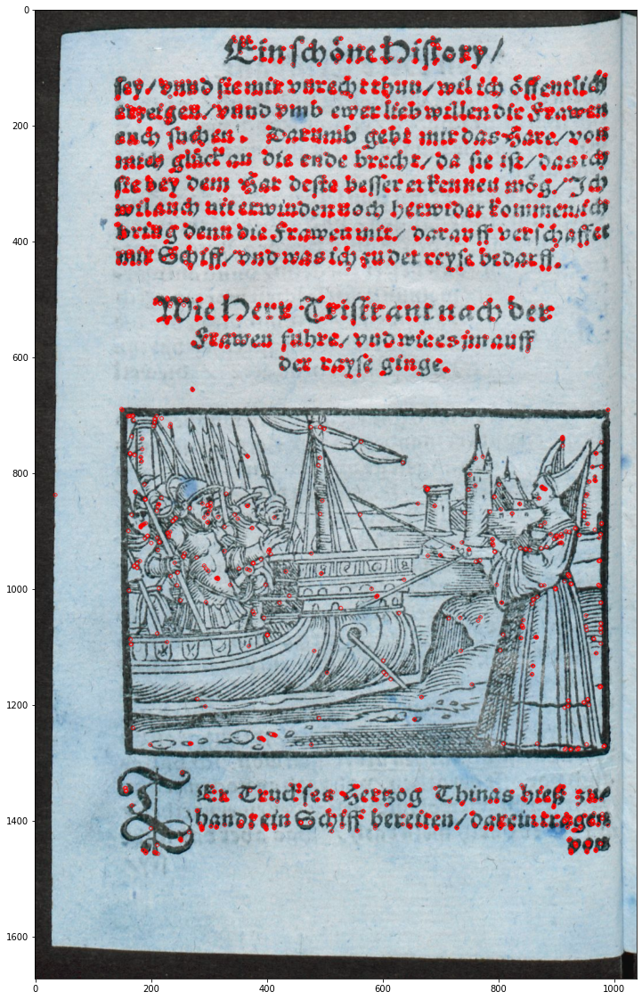

(<Figure size 1440x1440 with 1 Axes>,
 None)

In [16]:
'''
change number of features (nfeatures) to see the effect
'''

descriptorImpl = cv2.ORB_create(nfeatures=5000,scoreType=cv2.ORB_FAST_SCORE) # choose a descriptor type (ORB, SIFT, FAST ...) and a number of features first

kp1, des1 = descriptorImpl.detectAndCompute(img1,None)

keypointimg1 = cv2.drawKeypoints(img1,kp1, None, color=(255,0,0))
plt.figure(figsize = (20,20)), plt.imshow(keypointimg1),plt.show()

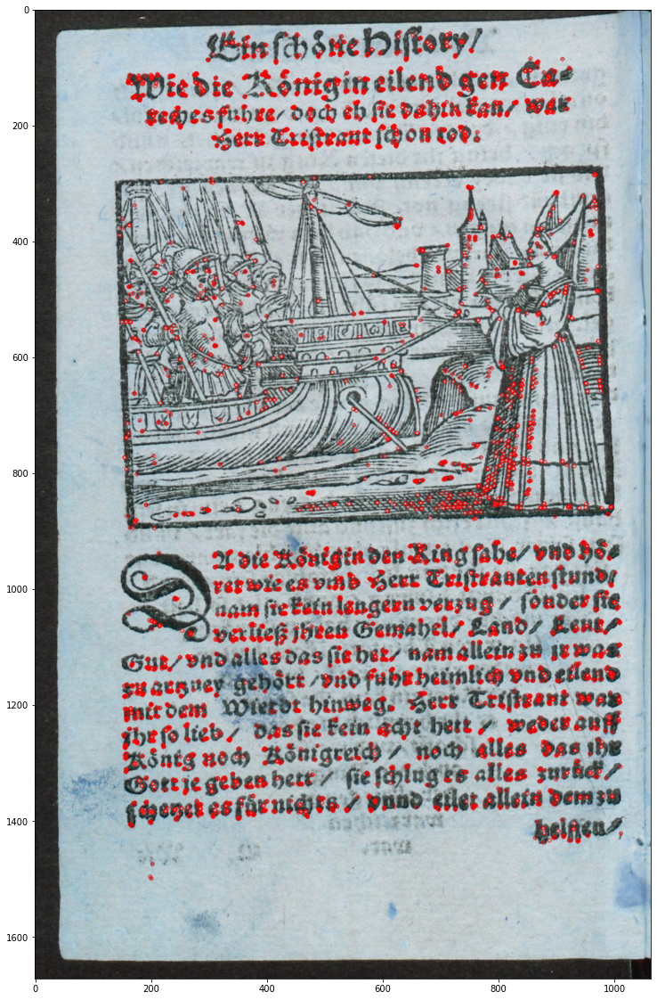

(<Figure size 1440x1440 with 1 Axes>,
 None)

In [18]:
img2 = loadImage("https://content.staatsbibliothek-berlin.de/dc/846205432-0244/full/full/0/default.jpg")

kp2, des2 = descriptorImpl.detectAndCompute(img2,None)

keypointimg2 = cv2.drawKeypoints(img2,kp2, None, color=(255,0,0))
plt.figure(figsize = (20,20)), plt.imshow(keypointimg2),plt.show()

<Figure size 432x288 with 0 Axes>

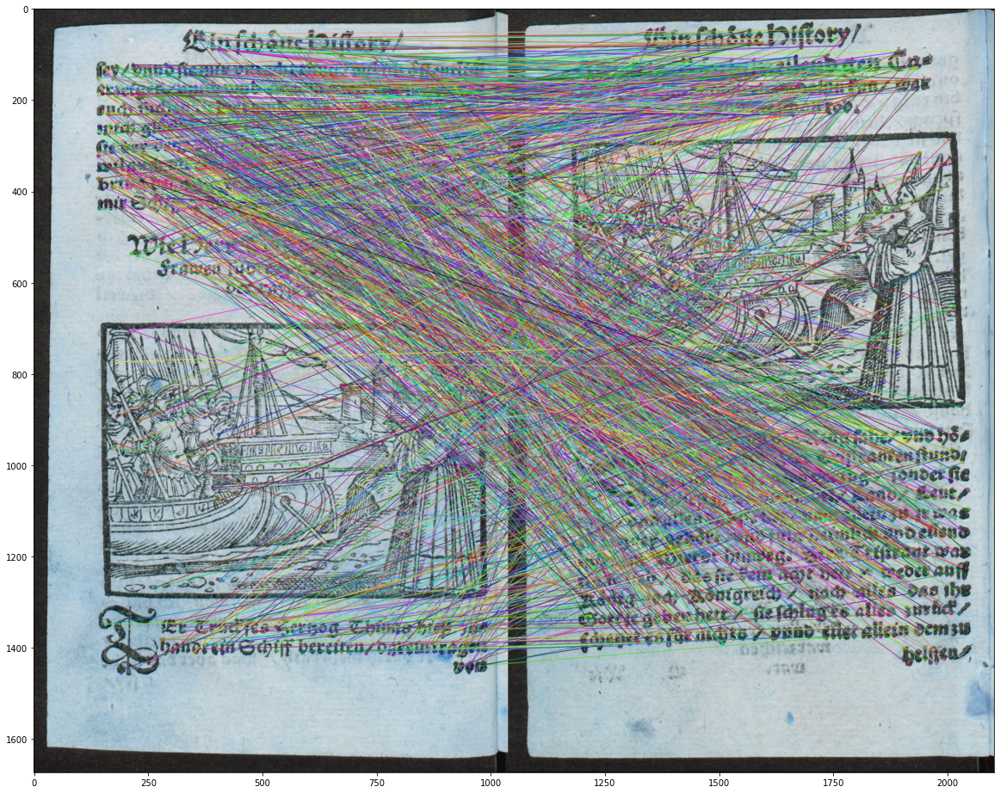

(<Figure size 1440x1440 with 1 Axes>,
 None)

In [25]:
# create BFMatcher object
def matchImgs(des1,des2):
    bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)

    # Match descriptors.
    matches = bf.match(des1,des2)

    # Sort them in the order of their distance.
    matches = sorted(matches, key = lambda x:x.distance)
    return matches

# Draw matches.
matches = matchImgs(des1,des2)
matchimg = cv2.drawMatches(img1,kp1,img2,kp2,matches, None, flags=2)

plt.figure()
plt.figure(figsize = (20,20)), plt.imshow(matchimg),plt.show()

The output does not really look promising, we have some good matches (book header with book header, illustration with illustration) and a lot of matches between the text areas.
We want to limit the matches to spacially plausible ones, so called 'inliers'. We use a library to do the job for use, utilizing nearest neighbours clustering.

5122 total matches found


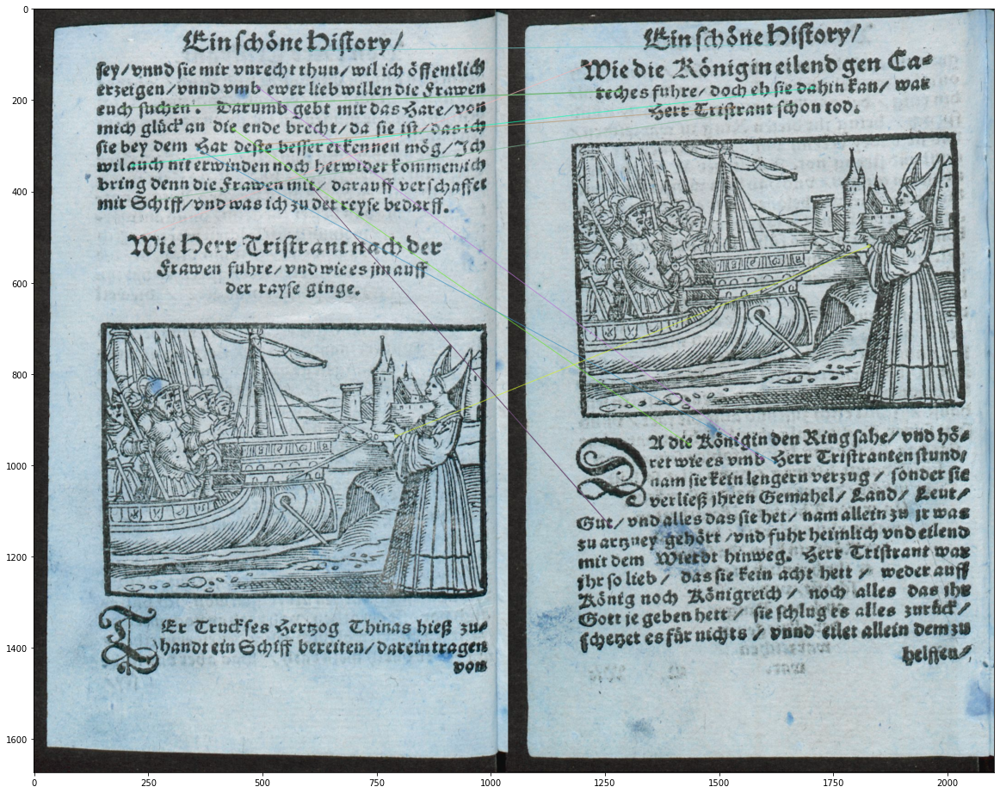

(<Figure size 1440x1440 with 1 Axes>,
 None)

In [22]:
#FLANN = Fast Library for Approximate Nearest Neighbors

def getGoodMatches(des1, des2):
    FLANN_INDEX_LSH = 6

    index_params= dict(algorithm = FLANN_INDEX_LSH,
                       table_number = 6, # 12
                       key_size = 12,     # 20
                       multi_probe_level = 1) #2

    search_params = dict(checks = 50)
    flann = cv2.FlannBasedMatcher(index_params, search_params)

    matches = flann.knnMatch(des1,des2,k=2)

    if len(matches)>0:
        print("{} total matches found".format(len(matches)))
    else:
        print("No matches were found")

    # store all the good matches as per Lowe's ratio test.
    good = []
    for m,n in matches:
        if m.distance < 0.6*n.distance:
            good.append(m)
    return good

# Draw matches.
good = getGoodMatches(des1,des2)
flannmatchesimg = cv2.drawMatches(img1,kp1,img2,kp2,good, None, flags=2)

plt.figure(figsize=(20,20)), plt.imshow(flannmatchesimg),plt.show()

5154 total matches found
19 good matches found


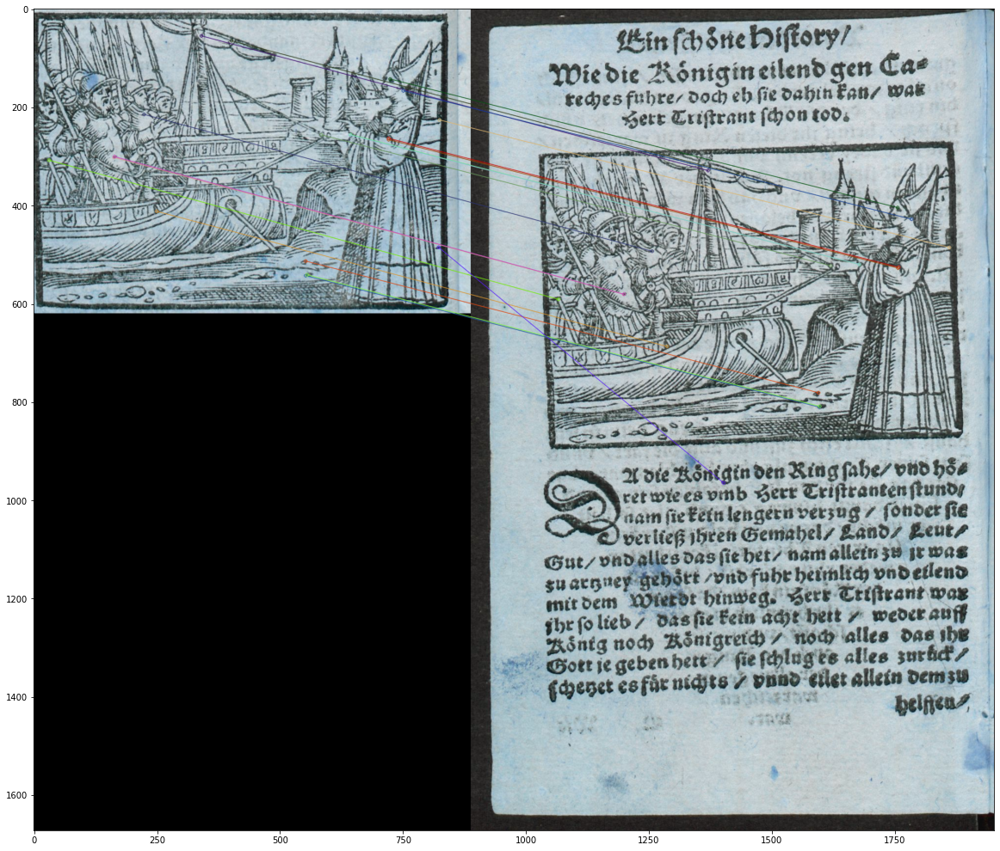

(<Figure size 1440x1440 with 1 Axes>,
 None)

In [28]:
img1roi = loadImage("https://content.staatsbibliothek-berlin.de/dc/846205432-0034/150,680,900,620/full/0/default.jpg")

kp1_, des1_ = descriptorImpl.detectAndCompute(img1roi,None)


good2 = getGoodMatches(des1_,des2)
flannmatchesimg2 = cv2.drawMatches(img1roi,kp1_,img2,kp2,good2, None, flags=2)


print("{} good matches found".format(len(good2)))
plt.figure(figsize=(20,20)), plt.imshow(flannmatchesimg2),plt.show()

## Other Examples

In the assets folder of this notebook you find 3 example images, already cropped to their ROI: `B+2802-00000136.jpg`, `B+2758-0146.jpg`, `B+2752-00284.jpg`.
Try your newly learned matching skills to check them against each other.

- How well does it work? What is the occuring problem with those images?
- Optional / Advanced: how could you adress / assess the occuring problem

In [29]:
### INSERT CODE FOR EXERCISE ###